In [37]:
import os
import json
import requests

import PyPDF2
import fitz
import re
import io
from io import StringIO
from pdfminer.layout import LAParams
from pdfminer.converter import HTMLConverter, TextConverter, XMLConverter
from pdfminer.pdfpage import PDFPage
from pdfminer.pdfinterp import PDFResourceManager, PDFPageInterpreter
import pdf2image
from pdf2image import convert_from_path
import pytesseract
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.support.select import Select
import time
import pyautogui

# 1. Scraping PDFs using BeautifulSoup after getting urls using scrapy:

In [32]:
def downloadPDF(url, path):
    content = requests.get(url).content
    filename = path+'\\'+url.split('/')[-1].split('.')[0]+'.pdf'
    with open(filename, 'wb') as f:
        f.write(content)
        f.close()

In [38]:
path = r'C:/Users/BOOR/Desktop/NLP_Project_v2/PDF_1'
pdf_list = []
html_list = []
with open('./marine_PDF_articles_urls.json') as json_file:
    urls_file = json.load(json_file)
    for url in urls_file:
        if url['url'].split('/')[-1].split('.')[-1] == 'pdf':
            pdf_list.append(url['url'])
        else:
            html_list.append(url['url'])

In [39]:
for url in pdf_list[:20]:
    downloadPDF(url, path)

# 2. Convert pdf file to text:

In [5]:
def pdf_text(path_to_pdf):
    resource_manager = PDFResourceManager(caching=True)
    out_text = StringIO()
    #codec = 'utf-8'
    laParams = LAParams()
    text_converter = TextConverter(resource_manager, out_text , laparams=laParams)
    fp = open(path_to_pdf, 'rb')
    interpreter = PDFPageInterpreter(resource_manager, text_converter)
    for page in PDFPage.get_pages(fp, pagenos=set(), maxpages=0, password="", caching=True, check_extractable=True):
        interpreter.process_page(page)
    text = out_text.getvalue()
    regex = r"(?:\r?\n){2}"
    subst = "."
    text = re.sub(regex, subst, text, 0)
    fp.close()
    text_converter.close()
    out_text.close()
    return text

In [6]:
file = 'C:/Users/BOOR/Desktop/NLP_Project_v2/PDFs/alb1001F.pdf'
content = pdf_text(file)
content

'REPUBLIQUE  POPULA IRL  SOCIALISTE  D\' ALBAIUE .PFlESIDIUl~  DE  L \'ASSEUBLEE  POPULA Irt.E .L  O I .SUE.  LA  l?ECHE .Afin  de  treduire  dens  les  feits  les  directives  du  Perti .du  Travail  d\'AlbEnie  sur  le  protection  et  le  developpement  de ..... .la  peche,  et  dans  l\'esprit  de  l\'erticle  67  de  la  c~nstitution, .sur  la  proposition  du  Conseil  des  ministres .L\'ASSEMBLEE  POFULAIRE .DE  LA  REPUBLI~UE  ?OPULAIRE  SOCIALISTH  D\'ALBANIE .e  pris  les  decisions  suivantes: .Article  1 .Les  poissons,  les  mam:niferes,  les  mollusques  et  au.tres .orgenismes  vivant  dens  les  eeux  interieures  et  ter:r-itorisles  de .la  Republique  p~pulsire  socialiste  d\'Albsnie  aont  propriete  de .l\'Etat. .tr iJ10 ine .. .Il  est  du  dev~ir  de  chaque  cit~yen  de  proteger  ce  ps(cid:173).Article  2 .La  ges~i~n  et  l\'org[nisstion  de  la  peche  dens  les  eeux .territ:Jriel~s  du  pays  einsi  que  dans  les  lacs,  etangs,  fleuves .et  rivieres,  

In [42]:
file = 'C:/Users/BOOR/Desktop/NLP_Project_v2/PDFs/alg45889.pdf'
content = pdf_text(file)
content

' .\x0c'

# 3. Converte scanned pdf file to text:

In [13]:
def pdf_img_text(path):
    pytesseract.pytesseract.tesseract_cmd = r'C:\Users\BOOR\AppData\Local\Tesseract-OCR\tesseract'
    pages = convert_from_path(path, 350, fmt='jpg', poppler_path=r'C:\Program Files\poppler-0.68.0_x86\poppler-0.68.0\bin')
    content = ""
    i = 1
    for page in pages:
        image_name = "Page_" + str(i) + ".jpg" 
        #save image 
        page.save(image_name)
        #load the original image
        img = cv2.imread(image_name)

        # convert the image to black and white for better OCR
        ret, thresh1 = cv2.threshold(img, 120, 255, cv2.THRESH_BINARY)

        # pytesseract image to string to get results
        text = str(pytesseract.image_to_string(thresh1, lang='fra', config='--psm 6'))
        regex = r"(?:\r?\n){2}"
        subst = "."
        text = re.sub(regex, subst, text, 0)
        content = content+' '+text
        i = i+1
    return content

In [40]:
file = 'C:/Users/BOOR/Desktop/NLP_Project_v2/PDFs/alg45889.pdf'
content = pdf_img_text(file)
content

" Arrêté ‘du 25 septembre 1974 portant création d’un centre\nd’océanographie et des pêches..Le ministre de l’enseignement supérieur et de la recherche\nscientifique,.Vu les ordonnances n°: 65-182 du 10 juillet 1965 et 70-53\ndu 18 djoumada I 1390 correspondant au 21 juillet 1970\nportant constitution du Gouvernement ;.Vu l'ordonnance n° 73-44 du 25 juillet 1973 portant création\nde l'organisme national de la recherche scientifique (O.N.R.S.) ;.Vu l'arrêté du 1° février 1974 portant fonctionnement\ndes centres de recherche ;.Arrête :.Article 1%, — Il est créé un centre de recherche intitulé\necentre d'océanographie et des pêches »..&on siège est fixé à Alger..Art, 2. — Conformément aux objectifs fixés à J'ONRS.\net dans le cadre d’une recherche intégrée au développement\net liée à la formation, le centre d’océanographie et des pêches\n& pour mission :.“ de développer une recherche appliquée dans le domaine\ndes pêches ayant pour objectifs la connaissance et le\ndéveloppement des ressour

In [43]:
file = 'C:/Users/BOOR/Desktop/NLP_Project_v2/PDFs/alg41657.pdf'
content = pdf_img_text(file)
content

' 20J da El Oula 1424.6 JOURNAL OFFICIEL DE LA REPUBLIQUE ALGERIENNE NY43 07 20 juillet 2003\nLoi nY 03-10 du 19 Joumada El Oula 1424 Vu la loi nY 90-08 du 7 avril 1990 relative à la.correspondant au 19 juillet 2003 relative à la commune ;.protection de l\'environnement dans le cadre du.développement durable. Vu la loi nY90-09 du 7 avril 1990 relative à la wilaya ;\nVu la loi nYŸ 90-25 du 18 novembre 1990, modifiée et.Le Président de la République, complétée, portant orientation foncière ;.Vu la Constitution,notamment ses articles 119, 120, Vu la loi nŸY 90-29 du ler décembre 1990, modifiée et\n122-19Yet 126 ; complétée, relative à l’aménagement et l’urbanisme ;.Vu l’ordonnance nY 66-154 du 8 juin 1966, modifiée et Vu la loi nY 90-30 du ler décembre 1990 portant loi\ncomplétée, portant code de procédure civile ; domaniale :.Vu l\'ordonnance n166-155 du 8 juin 1966, modifiée et Vu la loi nY 90-31 du 4 décembre 1990 relative aux\ncomplétée, portant code de procédure pénale ; ne :.assOCIa

# 4. Convert pdf file with block to text:

In [20]:
def img_to_text(path):
    # global variables (replace with you own file)
    SCANNED_FILE = path

    img = cv2.imread(SCANNED_FILE)

    zoom_x = 2.0 # horizontal zoom
    zoom_y = 2.0 # vertical zoom
    mat = fitz.Matrix(zoom_x, zoom_y)

    doc = fitz.open(SCANNED_FILE)
    
    i = 1
    img_list = []
    for page in doc:
        pix = page.get_pixmap(matrix=mat)
        png = 'output'+str(i)+'.png'
        img_list.append(png)
        pix.save(png)
        i += 1

    content = ""
    for i in range(len(img_list)):
        original_image = cv2.imread(img_list[i])

        # convert the image to grayscale
        gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
        plt.figure(figsize=(25, 15))
        plt.imshow(gray_image, cmap='gray')
        plt.show()

        # Performing OTSU threshold
        ret, threshold_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)
        plt.figure(figsize=(25, 15))
        plt.imshow(threshold_image, cmap='gray')
        plt.show()

        pytesseract.pytesseract.tesseract_cmd = r'C:/Users/BOOR/AppData/Local/Tesseract-OCR/tesseract'
        rectangular_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (66, 66))

        # Applying dilation on the threshold image
        dilated_image = cv2.dilate(threshold_image, rectangular_kernel, iterations=1)
        plt.figure(figsize=(25, 15))
        plt.imshow(threshold_image)
        plt.show()

        # Finding contours
        contours, hierarchy = cv2.findContours(dilated_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        # Creating a copy of the image
        copied_image = original_image.copy()

        with open("recognized-kernel-66-66"+str(i+1)+".txt", "w+") as f:
            f.write("")
        f.close()

        mask = np.zeros(original_image.shape, np.uint8)

        # Looping through the identified contours
        # Then rectangular part is cropped and passed on to pytesseract
        # pytesseract extracts the text inside each contours
        # Extracted text is then written into a text file
        for cnt in contours:
            x, y, w, h = cv2.boundingRect(cnt)

            # Cropping the text block for giving input to OCR
            cropped = copied_image[y:y + h, x:x + w]

            with open("recognized-kernel-66-66"+str(i+1)+".txt", "a") as f:
                # Apply OCR on the cropped image
                text = pytesseract.image_to_string(cropped, lang='fra', config='--oem 3 --psm 1')
                regex = r"(?:\r?\n){2}"
                subst = "."
                text = re.sub(regex, subst, text, 0)
                content += text
                
            masked = cv2.drawContours(mask, [cnt], 0, (255, 255, 255), -1)
        
        plt.figure(figsize=(25, 15))
        plt.imshow(masked, cmap='gray')
        plt.show()

    for i in range(len(img_list)):
        os.remove(str(img_list[i]))
        os.remove("recognized-kernel-66-66"+str(i+1)+".txt")
    
    return content

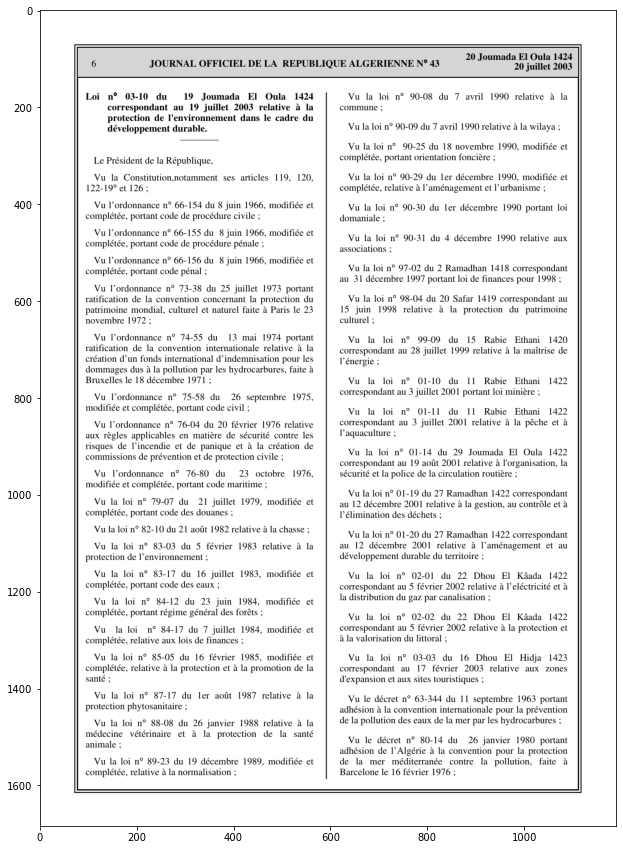

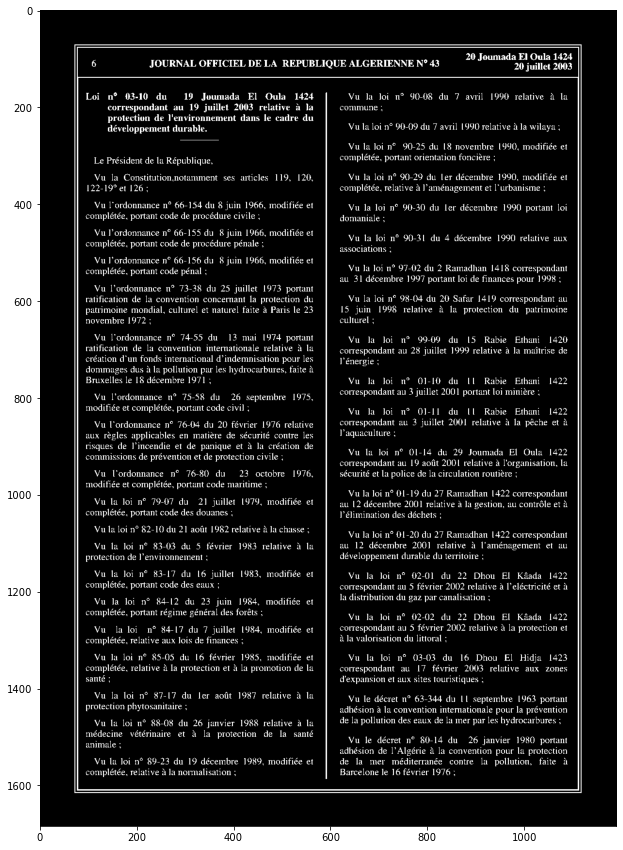

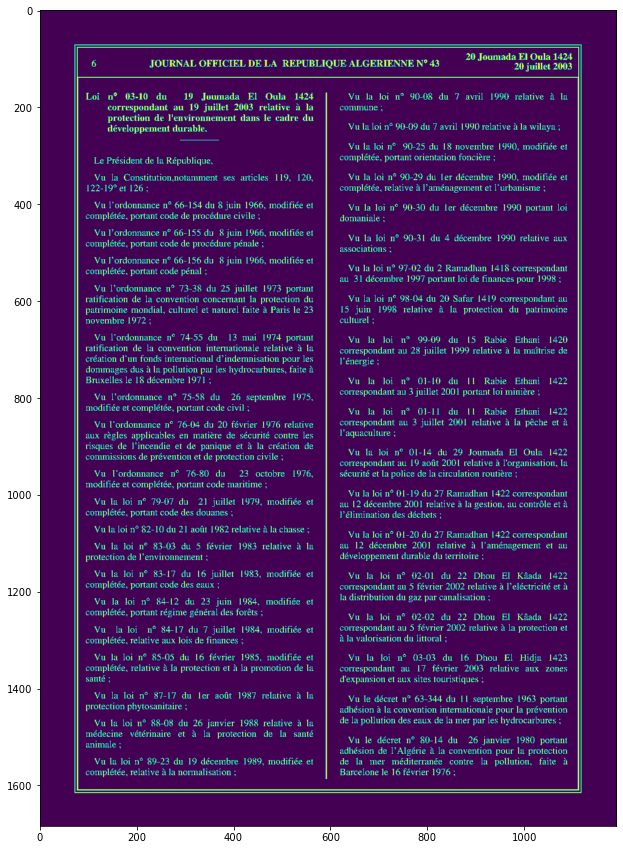

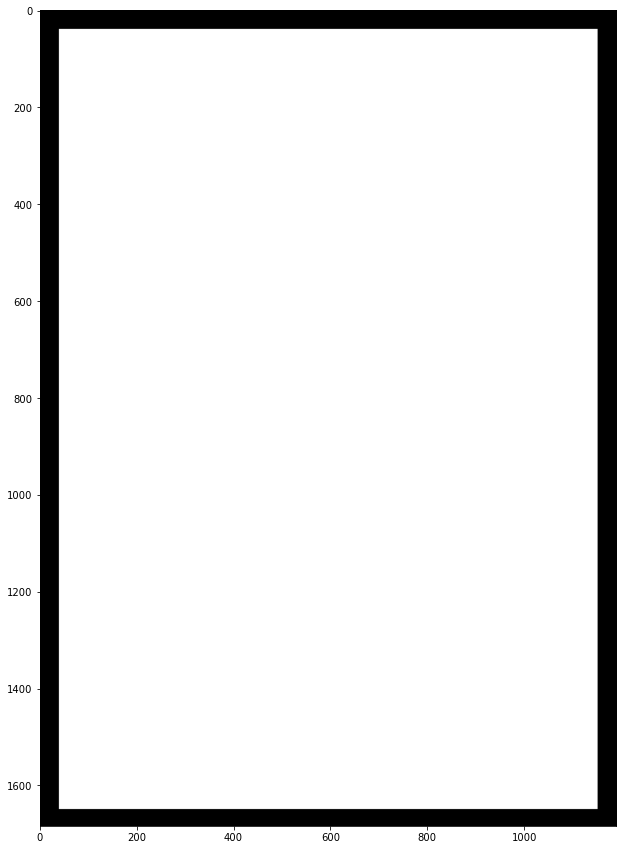

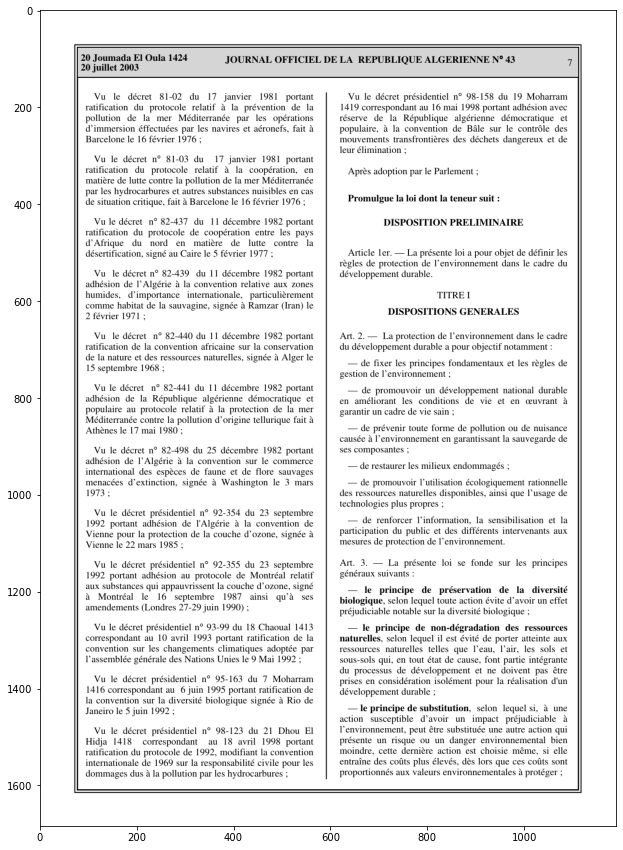

...

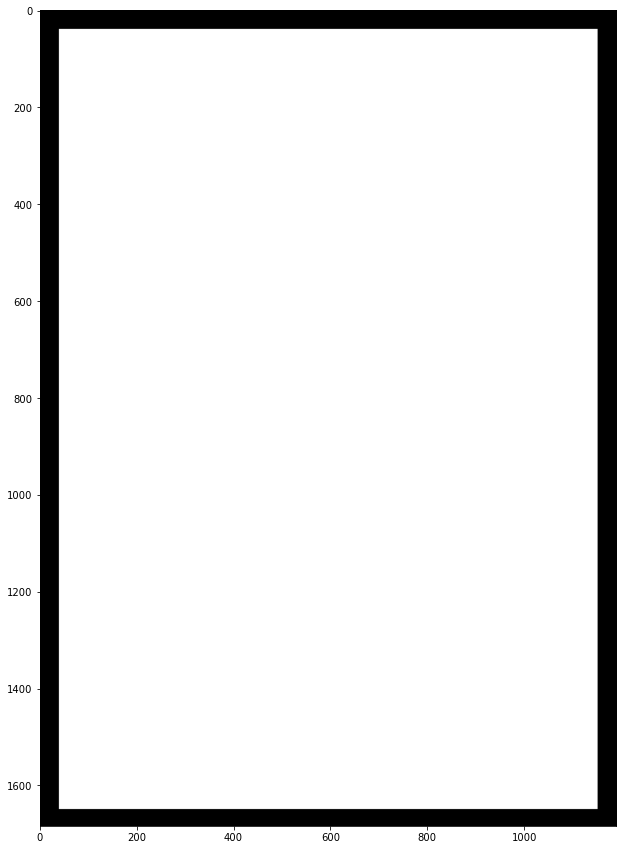

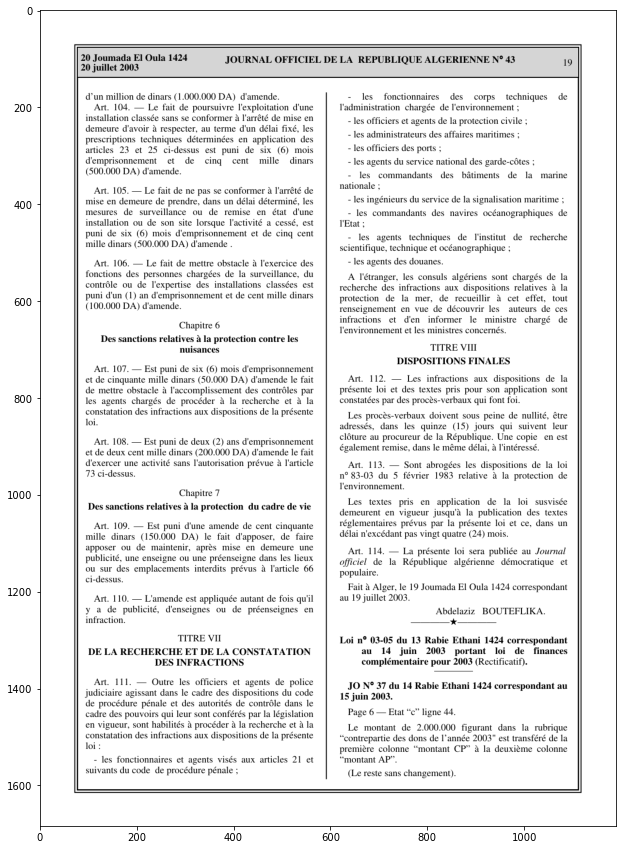

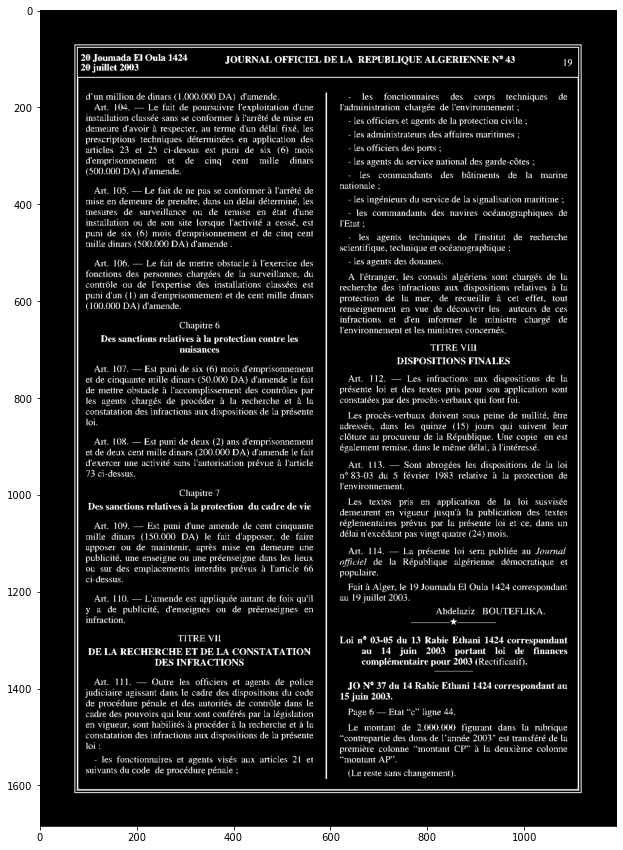

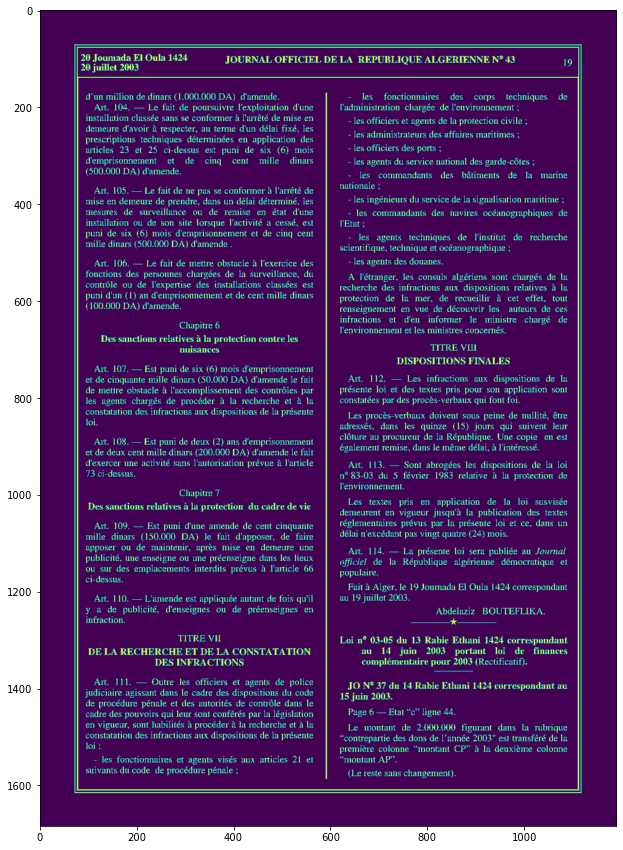

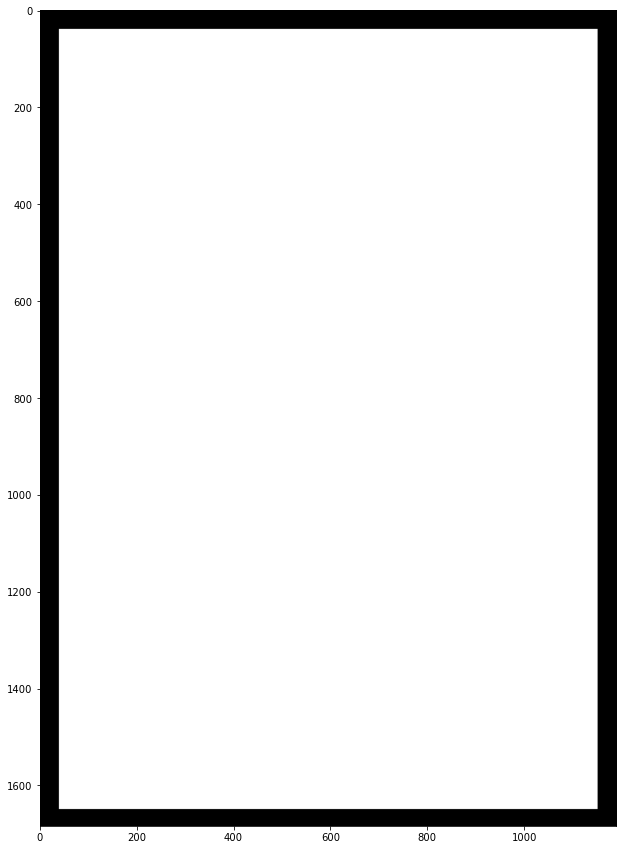

'6 JOURNAL OFFICIEL DE LA REPUBLIQUE ALGERIENNE N° 43.20 Joumada El Oula 1424\n20 juillet 2003.Loi n° 03-10 du 19 Joumada El Oula 1424\ncorrespondant au 19 juillet 2003 relative à la\nprotection de l\'environnement dans le cadre du\ndéveloppement durable..Le Président de la République,.Vu la Constitution notamment ses articles 119, 120,\n122-199 et 126 ;.Vu l\'ordonnance n° 66-154 du 8 juin 1966, modifiée et\ncomplétée, portant code de procédure civile ;.Vu l\'ordonnance n° 66-155 du_8 juin 1966, modifiée et\ncomplétée, portant code de procédure pénale :.Vu l’ordonnance n° 66-156 du 8 juin 1966, modifiée et\ncomplétée, portant code pénal ;.Vu l\'ordonnance n° 73-38 du 25 juillet 1973 portant\nratification de la convention concernant la protection du\npatrimoine mondial, culturel et naturel faite à Paris le 23\nnovembre 1972 ;.Vu l\'ordonnance n° 74-55 du 13 mai 1974 portant\nratification de la convention internationale relative à la\ncréation d’un fonds international d\'indemnisation p

In [44]:
path = "C:/Users/BOOR/Desktop/NLP_Project_v2/PDFs/alg41657.pdf"
text = img_to_text(path)
text

# 5. Online convert pdf files with block to text using selenium:

In [25]:
def convert_pdf_to_text(url, path):
    for file in os.listdir(path+str("\\")):
        file_name = path+"\\"+file
        
        driver = webdriver.Edge(r'C:\Users\BOOR\Downloads\edgedriver_win64\msedgedriver.exe')
        driver.get(url)
        time.sleep(3)

        driver.find_element(By.XPATH, "/html/body/div[4]/div[3]/div/div/div[1]/div/div/div/div[1]/div/div/button").click()
        time.sleep(5)
        pyautogui.typewrite(file_name)
        time.sleep(5)
        pyautogui.press('enter')
        time.sleep(30)
        
        languages = ["French", "Arabic"]
        
        for i in languages:
            driver.find_element(By.XPATH, '//*[@id="MultipleLanguages"]/div/div[3]/div[1]/div/div[2]').click()
            time.sleep(2)
            pyautogui.typewrite(i)
            time.sleep(5)
            pyautogui.press('enter')
            time.sleep(5)
            
        driver.find_element(By.XPATH, '//*[@id="sendform"]/div[1]/div[3]').click()
        time.sleep(5)
        
        driver.find_element(By.XPATH, '//*[@id="submitBtn"]').click()
        time.sleep(90)
        
        driver.find_element(By.XPATH, '//*[@id="page_function_container"]/div/div/div/div[1]/div[6]/div[2]/div/div/div[4]/div[2]/a[4]').click()
        time.sleep(5)
        driver.close()

In [23]:
## path contain all the pdf files
path = r'C:\Users\BOOR\Desktop\NLP_Project_v2\PDFs'
## url using to converte the pdfs online
url = "https://www.pdf2go.com/pdf-to-text"

In [ ]:
convert_pdf_to_text(url, path)